# Fibonacci Swing - Human Nature

Let's let's let's have have have fun fun! Let's let's let's let's let's have have have have have fun fun fun!

In [1]:
# TODO: Show results of before and after here (audio files)

In [2]:
# Import libraries
%matplotlib inline

import os

import IPython.display as ipd
import librosa, librosa.display
import numpy as np
import matplotlib.pyplot as plt

import bjorklund

## Feature extraction: detecting onsets and tempo

In [3]:
# Set parameters

# Load input audio file
# filename = "data/Michael Jackson - Human Nature.mp3"
# filename = "data/humannature_30s.mp3"
filename = "data/humannature_60s.mp3"
y, sr = librosa.load(filename)
ipd.Audio(y, rate=sr)

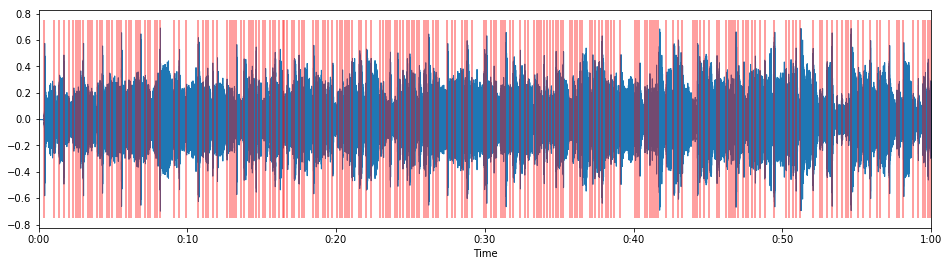

In [4]:
# Detect onsets
onset_frames = librosa.onset.onset_detect(y, sr=sr)
onset_times = librosa.frames_to_time(onset_frames)
# print(onset_times)

# Plot onset times with original waveform
plt.figure(figsize=(16, 4))
librosa.display.waveplot(y, sr=sr)
plt.vlines(onset_times, -0.75, 0.75, color="r", alpha=0.5)

In [5]:
# Listen to onsets
onset_clicks = librosa.clicks(frames=onset_frames, sr=sr, length=len(y))
ipd.Audio(y + onset_clicks, rate=sr)

In [6]:
# Estimate tempo
onset_env = librosa.onset.onset_strength(y, sr=sr) # TODO: Compare this with librosa.beat.beat_track
onset_env
tempo = librosa.beat.tempo(y, sr=sr, onset_envelope=onset_env)
print("Tempo (calculated): {}".format(tempo))
tempo = np.array([93.0]) # Hard-coded to test
print("Tempo (hard-coded): {}".format(tempo))

Tempo (calculated): [ 92.28515625]
Tempo (hard-coded): [ 93.]


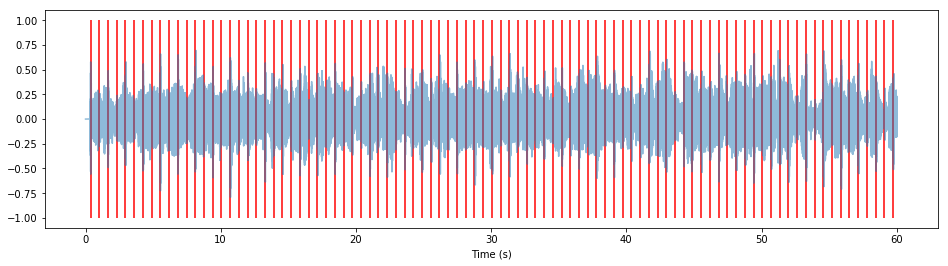

In [7]:
# Plot original waveform (essentially doing what librosa.display.waveplot does)
t = np.arange(0, len(y))/float(sr) # Ticks along x-axis; time in seconds
plt.figure(figsize=(16, 4))
plt.plot(t, y, alpha=0.5)
plt.xlabel("Time (s)")

# Calculate and plot beat times
T = len(y)/float(sr) # Total audio length in seconds
seconds_per_beat = 60.0/tempo
beat_times = np.arange(onset_times[0], T, seconds_per_beat) # Use onset_times[0] to start beat at first onset rather than time 0
plt.vlines(beat_times, -1, 1, color="r")

In [8]:
# Listen to beat clicks (i.e. a metronome)
beat_frames = librosa.time_to_frames(beat_times)
beat_clicks = librosa.clicks(frames=beat_frames, sr=sr, length=len(y))
ipd.Audio(y + beat_clicks, rate=sr)

In [9]:
beat_times

array([  0.37151927,   1.01668056,   1.66184186,   2.30700315,
         2.95216444,   3.59732573,   4.24248702,   4.88764831,
         5.5328096 ,   6.17797089,   6.82313218,   7.46829347,
         8.11345476,   8.75861605,   9.40377734,  10.04893863,
        10.69409992,  11.33926121,  11.9844225 ,  12.62958379,
        13.27474508,  13.91990637,  14.56506766,  15.21022895,
        15.85539024,  16.50055153,  17.14571282,  17.79087411,
        18.4360354 ,  19.08119669,  19.72635798,  20.37151927,
        21.01668056,  21.66184186,  22.30700315,  22.95216444,
        23.59732573,  24.24248702,  24.88764831,  25.5328096 ,
        26.17797089,  26.82313218,  27.46829347,  28.11345476,
        28.75861605,  29.40377734,  30.04893863,  30.69409992,
        31.33926121,  31.9844225 ,  32.62958379,  33.27474508,
        33.91990637,  34.56506766,  35.21022895,  35.85539024,
        36.50055153,  37.14571282,  37.79087411,  38.4360354 ,
        39.08119669,  39.72635798,  40.37151927,  41.01

## Rhythmic manipulation by way of Fibonacci, Euclid, and Bjorklund

In [10]:
# Define rhythm parameters
original_subdivisions_per_beat = 2
original_beats_per_measure = 4
original_subdivisions_per_measure = original_subdivisions_per_beat * original_beats_per_measure
original_pulses_per_measure = 3
print("Original subdivisions per measure: {}".format(original_subdivisions_per_measure))

# Set target rhythm parameters
# TODO: Make this more extensible, esp with regards to the Fibonacci sequence
target_subdivisions_per_measure = 11
print("Target subdivisions per measure: {}".format(target_subdivisions_per_measure))

Original subdivisions per measure: 8
Target subdivisions per measure: 11


Let's take a quick detour into Euclid land

In [11]:
# Generate Euclidean rhythms via Bjorklund's algorithm
original_rhythm = np.array(bjorklund.bjorklund(original_subdivisions_per_measure, original_pulses_per_measure))
target_rhythm = np.array(bjorklund.bjorklund(target_subdivisions_per_measure, original_pulses_per_measure))
print("Original rhythm pattern ({} pulses, {} subdivisions): {}\n"
      "Target rhythm pattern ({} pulses, {} subdivisions):  {}".format(original_pulses_per_measure, original_subdivisions_per_measure, original_rhythm,
                                                                original_pulses_per_measure, target_subdivisions_per_measure, target_rhythm))

Original rhythm pattern (3 pulses, 8 subdivisions): [1 0 0 1 0 0 1 0]
Target rhythm pattern (3 pulses, 11 subdivisions):  [1 0 0 0 1 0 0 0 1 0 0]


In [12]:
# Work in samples from here on
beat_samples = librosa.time_to_samples(beat_times)
beat_samples
# [y[s] for s in beat_samples]

array([   8192,   22417,   36643,   50869,   65095,   79321,   93546,
        107772,  121998,  136224,  150450,  164675,  178901,  193127,
        207353,  221579,  235804,  250030,  264256,  278482,  292708,
        306933,  321159,  335385,  349611,  363837,  378062,  392288,
        406514,  420740,  434966,  449191,  463417,  477643,  491869,
        506095,  520321,  534546,  548772,  562998,  577224,  591450,
        605675,  619901,  634127,  648353,  662579,  676804,  691030,
        705256,  719482,  733708,  747933,  762159,  776385,  790611,
        804837,  819062,  833288,  847514,  861740,  875966,  890191,
        904417,  918643,  932869,  947095,  961321,  975546,  989772,
       1003998, 1018224, 1032450, 1046675, 1060901, 1075127, 1089353,
       1103579, 1117804, 1132030, 1146256, 1160482, 1174708, 1188933,
       1203159, 1217385, 1231611, 1245837, 1260062, 1274288, 1288514,
       1302740, 1316966])

In [13]:
# Calculate measure indices in samples
def calculate_measure_samples(y, beat_samples, beats_per_measure):
    max_samples = len(y)
    start_sample = beat_samples[0]
    beat_interval = beat_samples[1] - beat_samples[0]
    measure_interval = beat_interval * beats_per_measure
    if measure_interval >= beat_interval:
        return beat_samples[::beats_per_measure]
    else:
        # return np.arange(start_sample, max_samples, measure_interval)
        beat_indices = np.indices([len(beat_samples)])[0]
        measure_indices = np.indices([len(beat_samples)/beats_per_measure])[0]
        # print("Beat indices: {}, measure indices: {}".format(beat_indices, measure_indices))
        return np.interp(measure_indices, beat_indices/beats_per_measure, beat_samples)

measure_samples = calculate_measure_samples(y, beat_samples, original_beats_per_measure)
# measure_samples = calculate_measure_samples(y, beat_samples, 0.5) # Testing when measure_interval < beat_interval
print("Mesaure samples: {}".format(measure_samples))

measure_frames = librosa.samples_to_frames(measure_samples)
measure_clicks = librosa.clicks(frames=measure_frames, sr=sr, length=len(y))
ipd.Audio(y + measure_clicks, rate=sr)

Mesaure samples: [   8192   65095  121998  178901  235804  292708  349611  406514  463417
  520321  577224  634127  691030  747933  804837  861740  918643  975546
 1032450 1089353 1146256 1203159 1260062 1316966]


## Modifying the original audio track

In [14]:
# Defining the functions we'll use

# Modify an entire audio track
def modify_track(data, measure_samples, original_rhythm, target_rhythm):
    modified_track_data = np.array([])
    for i, sample in enumerate(measure_samples[:-1]):
        measure_start = measure_samples[i]
        measure_stop = measure_samples[i+1]
        measure_data = data[measure_start:measure_stop]
        modified_measure_data = modify_measure(measure_data, original_rhythm, target_rhythm)
        modified_track_data = np.hstack((modified_track_data, modified_measure_data))
    return modified_track_data

# Modify a single measure
def modify_measure(data, original_rhythm, target_rhythm):
    modified_data = np.array([])
    
    # Define the rhythmic properties we'll use
    original_num_samples = len(data)
    original_num_subdivisions = len(original_rhythm)
    target_num_subdivisions = len(target_rhythm)
    
    # Get indices of subdivisions for measure
    original_subdivision_step = original_num_samples / float(original_num_subdivisions)
    original_subdivision_indices = np.arange(0, original_num_samples, original_subdivision_step, dtype="int")
    # print("Original subdivision indices: {}".format(original_subdivision_indices))
    # print("Original rhythm: {}".format(original_rhythm))
    
    # Get only indices of pulses based on rhythm
    original_pulse_indices = np.array([original_subdivision_indices[i] for i in range(original_num_subdivisions) if original_rhythm[i] > 0])
    # original_pulse_indices = original_subdivision_indices # Use all subdivisions
    # print("Original pulse indices: {}".format(original_pulse_indices))
    
    # Calculate pulse ratios
    pulse_ratios = calculate_pulse_ratios(original_rhythm, target_rhythm)
    
    # Concatenate time-stretched versions of rhythm's pulses
    # NOTE: These pulses are based on the *rhythm* and thus are different from subdivisions of a *measure*.
    #       (In fact, these pulses will comprise concatenations of multiple measure subdivisions)
    for i,p in enumerate(original_pulse_indices):
        # Get pulse sample data
        pulse_start = p
        pulse_stop = len(data)-1
        if i < len(original_pulse_indices)-1:
            pulse_stop = original_pulse_indices[i+1]        
        pulse_samples = data[pulse_start:pulse_stop]
            
        # This yields some fun behavior! Time warping -> new meter.
        # e.g 7/8 at around 0.95, 6/8 at around 0.905. Not super precise
        # ^ when we use it with original_pulse_indices == original_subdivision_indices to get complete measure
        # pulse_samples = data[pulse_start:int(pulse_stop*0.95)]
        
        # Time-stretch this subdivision based on ratio of old to new rhythm length
        # TODO: Try out other methods of manipulation, such as:
        #       - Repeating subdivisions within pulses
        #       - Time-stretching subdivisions instead of entire pulses
        #       - Using onset detection in addition to subdivisions and pulses
        #       - A combination of the above
        pulse_samples = librosa.effects.time_stretch(pulse_samples, pulse_ratios[i])
        
        # Add the samples to our modified audio time series
        modified_data = np.hstack((modified_data, pulse_samples))
    
    # return data[:(len(data)/4)]
    return modified_data

# Calculate ratios between pulses for two rhythm sequences
# NOTE: This assumes that both rhythm sequences have the same number of pulses!
def calculate_pulse_ratios(original_rhythm, target_rhythm):
    original_pulse_lengths = np.array(([i for i,p in enumerate(original_rhythm) if p > 0]))
    original_pulse_lengths = np.hstack((original_pulse_lengths, len(original_rhythm)))
    original_pulse_lengths = np.array([original_pulse_lengths[i+1] - original_pulse_lengths[i] for i in range(len(original_pulse_lengths) - 1)])

    target_pulse_lengths = np.array(([i for i,p in enumerate(target_rhythm) if p > 0]))
    target_pulse_lengths = np.hstack((target_pulse_lengths, len(target_rhythm)))
    target_pulse_lengths = np.array([target_pulse_lengths[i+1] - target_pulse_lengths[i] for i in range(len(target_pulse_lengths) - 1)])
    
    num_pulses = min(len(original_pulse_lengths), len(target_pulse_lengths))
    
    pulse_ratios = np.array([target_pulse_lengths[i]/float(original_pulse_lengths[i]) for i in range(num_pulses)])
    return pulse_ratios

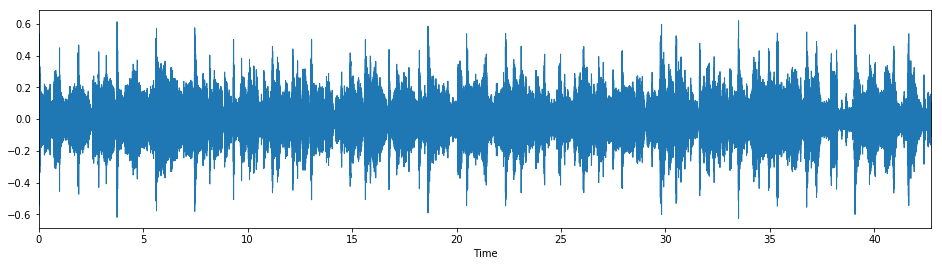

In [15]:
# Plot and listen to the modified track
y_modified = modify_track(y, measure_samples, original_rhythm, target_rhythm)
plt.figure(figsize=(16, 4))
librosa.display.waveplot(y_modified, sr=sr)
ipd.Audio(y_modified, rate=sr)

In [ ]:
# Add clicks, then plot and listen
# TODO

## Miscellaneous jots and tests

In [16]:
librosa.frames_to_samples?
librosa.effects.time_stretch?
# np.arange?

In [17]:
test_i0 = measure_samples[0]
test_i1 = measure_samples[1]
test_step = abs(test_i1-test_i0)/float(len(original_rhythm))
test_seg = np.arange(test_i0, test_i1, test_step, dtype="int")
test_seg

array([ 8192, 15304, 22416, 29528, 36640, 43752, 50864, 57976])

In [18]:
test_pulse_ratios = np.array(([i for i,p in enumerate(original_rhythm) if p > 0]))
test_pulse_ratios = np.hstack((test_pulse_ratios, len(original_rhythm)))
test_pulse_ratios = np.array([test_pulse_ratios[i+1] - test_pulse_ratios[i] for i in range(len(test_pulse_ratios) - 1)])
test_pulse_ratios

calculate_pulse_ratios(original_rhythm, target_rhythm)

array([ 1.33333333,  1.33333333,  1.5       ])